# B

In [6]:
import screed
import re
import pandas as pd
import numpy as np
import seaborn as sns
import os

#contig_file = "./ma.contigs.fasta"
contig_file = "/home/sih13/Downloads/diego_assem/B.asm.contigs.fasta"

In [7]:
rx = re.compile(r'(\S+) len=(\d+) reads=(\d+) class=(\w+) suggestRepeat=(\w+) suggestBubble=(\w+) suggestCircular=(\w+)')


temp = {}


with screed.open(contig_file) as seqfile:
    for read in seqfile:
        #print(read.name)

        match_rx = rx.match(read.name)

        if match_rx:
            temp[match_rx.group(1)] = [int(match_rx.group(2)), int(match_rx.group(3)), match_rx.group(4), match_rx.group(5), match_rx.group(6), match_rx.group(7)]

df = pd.DataFrame.from_dict(temp, orient="index", columns=["len", "reads", "class", "repeat", "bubble", "circular"])
df.index.name = "bin"

<AxesSubplot:xlabel='len'>

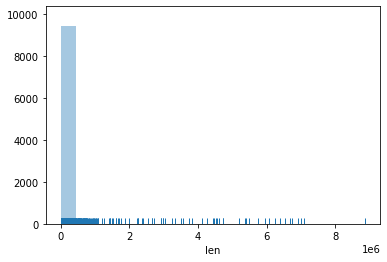

In [8]:
sns.distplot(df["len"], bins=20, kde=False, rug=True)

<AxesSubplot:xlabel='reads'>

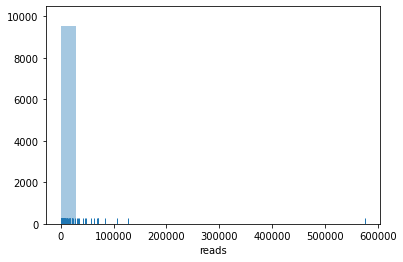

In [9]:
sns.distplot(df["reads"], bins=20, kde=False, rug=True)

In [10]:
len(df[df["len"] > 1000000])

65

In [11]:
output_folder = "./B_bigger_than_1m"

cutoff = 1000000

with screed.open(contig_file) as seqfile:
    for read in seqfile:
        #print(read.name)

        match_rx = rx.match(read.name)

        if match_rx:
            if int(match_rx.group(2)) > cutoff or match_rx.group(7) == "yes":
                output_file = os.path.join(output_folder, match_rx.group(1) + ".fasta")
                with open(output_file, 'w') as the_file:
                    the_file.write(f'>{read.name}\n{read.sequence}')

In [12]:
### get the fasta larger than 1m
output_contig_list = "./B_bigger_than_1m_list.txt"

cutoff = 1000000

contig_list = set()

with screed.open(contig_file) as seqfile:
    for read in seqfile:
        #print(read.name)

        match_rx = rx.match(read.name)

        if match_rx:
            if int(match_rx.group(2)) > cutoff or match_rx.group(7) == "yes":
                contig_list.add(read.name.split()[0])
                #output_file = os.path.join(output_folder, match_rx.group(1) + ".fasta")
                #with open(output_file, 'w') as the_file:
                #    the_file.write(f'>{read.name}\n{read.sequence}')

with open(output_contig_list, 'w') as contig_list_file:
    contig_list_file.write("\n".join(contig_list))

In [16]:
checkm = pd.read_csv("./B_checkm.txt", sep="\t")

In [17]:
checkm.set_index("bin")

,marker lineage,Completeness,Contamination,Mean contig length,N50 (contigs),Coding density,# contigs,Genome size,GC
bin,,,,,,,,,
tig00000182,f__Enterobacteriaceae,50.77,0.04,2402354.0,2402354,0.87,1,2402354,0.58
tig00000227,p__Bacteroidetes,100.00,0.00,5943917.0,5943917,0.92,1,5943917,0.39
tig00000103,g__Pseudomonas,99.36,3.06,6239742.0,6239742,0.89,1,6239742,0.62
tig00000121,f__Enterobacteriaceae,99.85,1.68,6377575.0,6377575,0.88,1,6377575,0.53
tig00000059,f__Pseudomonadaceae,98.90,0.83,6921665.0,6921665,0.88,1,6921665,0.62
...,...,...,...,...,...,...,...,...,...
tig00162948,o__Rhizobiales,60.74,0.20,2552853.0,2552853,0.88,1,2552853,0.63
tig00162901,p__Bacteroidetes,99.84,3.33,6546994.0,6546994,0.89,1,6546994,0.40
tig00162863,p__Bacteroidetes,100.00,0.48,6065883.0,6065883,0.92,1,6065883,0.39


In [18]:
bigger_than_1m = df.merge(checkm, left_on="bin", right_on="bin")

In [19]:
bigger_than_1m[(bigger_than_1m["circular"] == "yes") & (bigger_than_1m["len"] > 500000)]

,bin,len,reads,class,repeat,bubble,circular,marker lineage,Completeness,Contamination,Mean contig length,N50 (contigs),Coding density,# contigs,Genome size,GC
0,tig00000003,7001079,83349,contig,no,no,yes,f__Pseudomonadaceae,99.38,2.06,7001078.0,7001078,0.89,1,7001078,0.63
2,tig00000060,6670278,71241,contig,no,no,yes,f__Comamonadaceae,99.85,0.00,6670277.0,6670277,0.90,1,6670277,0.67
3,tig00000092,7073053,22301,contig,no,no,yes,f__Comamonadaceae,99.85,1.44,7073052.0,7073052,0.90,1,7073052,0.66
4,tig00000103,6239743,70045,contig,no,no,yes,g__Pseudomonas,99.36,3.06,6239742.0,6239742,0.89,1,6239742,0.62
5,tig00000121,6377576,21117,contig,no,no,yes,f__Enterobacteriaceae,99.85,1.68,6377575.0,6377575,0.88,1,6377575,0.53
8,tig00000283,5497483,26503,contig,no,no,yes,f__Comamonadaceae,99.38,1.12,5497482.0,5497482,0.88,1,5497482,0.63
9,tig00000293,5410442,21114,contig,no,no,yes,p__Bacteroidetes,100.00,0.00,5410441.0,5410441,0.92,1,5410441,0.39
12,tig00000432,4268680,106982,contig,no,no,yes,o__Flavobacteriales,100.00,1.96,4268679.0,4268679,0.89,1,4268679,0.35
14,tig00001291,4102151,9498,contig,no,no,yes,f__Paenibacillaceae,97.58,0.18,4102150.0,4102150,0.89,1,4102150,0.45
15,tig00001326,3574088,56344,contig,no,no,yes,o__Sphingomonadales,99.48,3.10,3574087.0,3574087,0.91,1,3574087,0.65


In [20]:
bigger_than_1m[(bigger_than_1m["Completeness"] > 90) & (bigger_than_1m["Contamination"] < 10)]

,bin,len,reads,class,repeat,bubble,circular,marker lineage,Completeness,Contamination,Mean contig length,N50 (contigs),Coding density,# contigs,Genome size,GC
0,tig00000003,7001079,83349,contig,no,no,yes,f__Pseudomonadaceae,99.38,2.06,7001078.0,7001078,0.89,1,7001078,0.63
1,tig00000059,6921666,46631,contig,no,no,no,f__Pseudomonadaceae,98.90,0.83,6921665.0,6921665,0.88,1,6921665,0.62
2,tig00000060,6670278,71241,contig,no,no,yes,f__Comamonadaceae,99.85,0.00,6670277.0,6670277,0.90,1,6670277,0.67
3,tig00000092,7073053,22301,contig,no,no,yes,f__Comamonadaceae,99.85,1.44,7073052.0,7073052,0.90,1,7073052,0.66
4,tig00000103,6239743,70045,contig,no,no,yes,g__Pseudomonas,99.36,3.06,6239742.0,6239742,0.89,1,6239742,0.62
5,tig00000121,6377576,21117,contig,no,no,yes,f__Enterobacteriaceae,99.85,1.68,6377575.0,6377575,0.88,1,6377575,0.53
7,tig00000227,5943918,33926,contig,no,no,no,p__Bacteroidetes,100.00,0.00,5943917.0,5943917,0.92,1,5943917,0.39
8,tig00000283,5497483,26503,contig,no,no,yes,f__Comamonadaceae,99.38,1.12,5497482.0,5497482,0.88,1,5497482,0.63
9,tig00000293,5410442,21114,contig,no,no,yes,p__Bacteroidetes,100.00,0.00,5410441.0,5410441,0.92,1,5410441,0.39
10,tig00000415,4617220,16988,contig,no,no,no,f__Paenibacillaceae,98.12,0.57,4617219.0,4617219,0.85,1,4617219,0.39


# E

In [22]:
e_contig_file = "/home/sih13/Downloads/diego_assem/E.asm.contigs.fasta"

In [23]:
rx = re.compile(r'(\S+) len=(\d+) reads=(\d+) class=(\w+) suggestRepeat=(\w+) suggestBubble=(\w+) suggestCircular=(\w+)')


temp = {}


with screed.open(e_contig_file) as seqfile:
    for read in seqfile:
        #print(read.name)

        match_rx = rx.match(read.name)

        if match_rx:
            temp[match_rx.group(1)] = [int(match_rx.group(2)), int(match_rx.group(3)), match_rx.group(4), match_rx.group(5), match_rx.group(6), match_rx.group(7)]

e_df = pd.DataFrame.from_dict(temp, orient="index", columns=["len", "reads", "class", "repeat", "bubble", "circular"])
e_df.index.name = "bin"

<AxesSubplot:xlabel='len'>

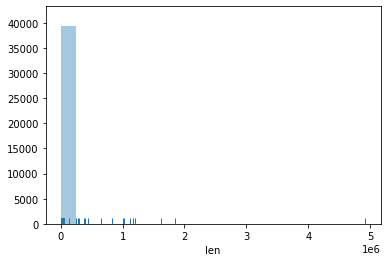

In [28]:
sns.distplot(e_df["len"], bins=20, kde=False, rug=True)

<AxesSubplot:xlabel='reads'>

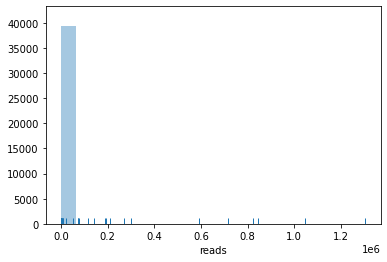

In [29]:
sns.distplot(e_df["reads"], bins=20, kde=False, rug=True)

In [30]:
len(e_df[e_df["len"] > 1000000])

8

In [31]:
output_folder = "./E_bigger_than_1m"

cutoff = 1000000

with screed.open(e_contig_file) as seqfile:
    for read in seqfile:
        #print(read.name)

        match_rx = rx.match(read.name)

        if match_rx:
            if int(match_rx.group(2)) > cutoff or match_rx.group(7) == "yes":
                output_file = os.path.join(output_folder, match_rx.group(1) + ".fasta")
                with open(output_file, 'w') as the_file:
                    the_file.write(f'>{read.name}\n{read.sequence}')

In [32]:
### get the fasta larger than 1m
output_contig_list = "./E_bigger_than_1m_list.txt"

cutoff = 1000000

contig_list = set()

with screed.open(e_contig_file) as seqfile:
    for read in seqfile:
        #print(read.name)

        match_rx = rx.match(read.name)

        if match_rx:
            if int(match_rx.group(2)) > cutoff or match_rx.group(7) == "yes":
                contig_list.add(read.name.split()[0])
                #output_file = os.path.join(output_folder, match_rx.group(1) + ".fasta")
                #with open(output_file, 'w') as the_file:
                #    the_file.write(f'>{read.name}\n{read.sequence}')

with open(output_contig_list, 'w') as contig_list_file:
    contig_list_file.write("\n".join(contig_list))

In [35]:
e_checkm = pd.read_csv("./E_checkm.txt", sep="\t")

In [36]:
e_checkm.set_index("bin")

,marker lineage,Completeness,Contamination,Mean contig length,N50 (contigs),Coding density,# contigs,Genome size,GC
bin,,,,,,,,,
tig00001089,root,0.00,0.00,1011674.0,1011674,0.91,1,1011674,0.55
tig00000513,root,4.17,0.00,1119434.0,1119434,0.89,1,1119434,0.57
tig01360638,root,4.17,0.00,1197998.0,1197998,0.88,1,1197998,0.64
tig00000587,k__Bacteria,8.77,0.00,1014876.0,1014876,0.88,1,1014876,0.63
tig01360635,k__Bacteria,8.62,0.00,1161199.0,1161199,0.90,1,1161199,0.64
tig00000277,k__Bacteria,35.09,0.00,1844194.0,1844194,0.89,1,1844194,0.63
tig00000528,c__Alphaproteobacteria,46.96,0.00,1626962.0,1626962,0.87,1,1626962,0.57
tig00000001,f__Paenibacillaceae,97.04,0.76,4922906.0,4922906,0.86,1,4922906,0.38


In [37]:
e_bigger_than_1m = e_df.merge(e_checkm, left_on="bin", right_on="bin")

In [38]:
e_bigger_than_1m[(e_bigger_than_1m["circular"] == "yes") & (e_bigger_than_1m["len"] > 500000)]

,bin,len,reads,class,repeat,bubble,circular,marker lineage,Completeness,Contamination,Mean contig length,N50 (contigs),Coding density,# contigs,Genome size,GC
5,tig00001089,1011675,192546,contig,no,no,yes,root,0.0,0.0,1011674.0,1011674,0.91,1,1011674,0.55


In [39]:
e_bigger_than_1m[(e_bigger_than_1m["Completeness"] > 90) & (e_bigger_than_1m["Contamination"] < 10)]

,bin,len,reads,class,repeat,bubble,circular,marker lineage,Completeness,Contamination,Mean contig length,N50 (contigs),Coding density,# contigs,Genome size,GC
0,tig00000001,4922907,1047813,contig,no,no,no,f__Paenibacillaceae,97.04,0.76,4922906.0,4922906,0.86,1,4922906,0.38
